#### The aim of this project is to predict the energy use of lights and appliances in a low-energy building using the UCI data set collected in 2017. This dataset is provided to us by tutoring team of Computational Machine Learning, Master of AI at RMIT University. The description of the dataset was also found within the same resources provided to us.

In [1]:
# Importing the necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from copy import deepcopy
import random

### Retrieving the dataset

In [2]:
""" As per the scope of this of this project, the provided dataset is enough and we do not require any other
    to conduct and express our analysis of this problem. """

df = pd.read_csv('UCI_data.csv')

#### The description of the dataset as provided with the resources of the project.

date time year-month-day hour:minute:second <br>
T1 -  Temperature in kitchen area, in Celsius <br>
RH_1 -  Humidity in kitchen area, in % <br>
T2 - Temperature in living room area, in Celsius <br> 
RH_2 - Humidity in living room area, in % <br>
T3 -  Temperature in laundry room area <br>
RH_3 -  Humidity in laundry room area, in % <br>
T4 -  Temperature in office room, in Celsius <br>
RH_4 -  Humidity in office room, in % <br>
T5 - Temperature in bathroom, in Celsius <br>
RH_5 - Humidity in bathroom, in % <br>
T6 - Temperature outside the building (north side), in Celsius <br>
RH_6 - Humidity outside the building (north side), in % <br>
T7 - Temperature in ironing room , in Celsius <br>
RH_7 - Humidity in ironing room, in % <br>
T8 - Temperature in teenager room 2, in Celsius <br>
RH_8 - Humidity in teenager room 2, in % <br>
T9 - Temperature in parents room, in Celsius <br>
RH_9 - Humidity in parents room, in % <br>
To - Temperature outside (from Chievres weather station), in Celsius <br>
Pressure - (from Chievres weather station), in mm Hg <br>
RH_out - Humidity outside (from Chievres weather station), in % <br>
Wind speed - (from Chievres weather station), in m/s <br>
Visibility - (from Chievres weather station), in km <br>
Tdewpoint - (from Chievres weather station), Â°C <br>
rv1 - Random variable 1, nondimensional <br>
rv2 - Random variable 2, nondimensional <br>
<br>
------------------------------------------------------------------------------ <br>
TARGET_Energy - energy use of Appliances and light fixtures in the house in Wh

### Data Preparation

In [3]:
# Printing the name and the number of columns

print("Number of columns:- {} columns".format(len(df.columns)))
print("Column Names:- ",", ".join(list(df.columns)))

Number of columns:- 28 columns
Column Names:-  date, T1, RH_1, T2, RH_2, T3, RH_3, T4, RH_4, T5, RH_5, T6, RH_6, T7, RH_7, T8, RH_8, T9, RH_9, T_out, Press_mm_hg, RH_out, Windspeed, Visibility, Tdewpoint, rv1, rv2, TARGET_energy


In [4]:
""" As there are a lot of columns and we may require to print all of them, we will increase the limit
    of the number of columns that can be printed at one time """

pd.set_option("display.max_columns", None)

In [5]:
# Printing some rows to get a basic idea of the data

df.head()

,date,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
0,2016-04-19 20:30:00,22.200000,39.500000,20.566667,37.656667,22.230000,37.030000,22.318571,36.610000,20.633333,62.166667,8.823333,13.296667,21.00,29.318571,22.23,38.463333,19.926667,33.90,9.70,766.100000,65.5,3.500000,40.000000,3.350000,24.061869,24.061869,60
1,2016-03-05 04:40:00,20.356667,37.126667,17.566667,40.230000,20.890000,37.663333,18.700000,36.260000,18.463333,43.560000,1.230000,78.963333,18.39,32.290000,21.00,43.400000,18.390000,41.09,0.30,740.333333,99.0,1.000000,41.333333,0.100000,4.622052,4.622052,50
2,2016-03-14 12:40:00,20.926667,38.790000,21.100000,35.526667,21.600000,36.290000,21.000000,34.826667,18.100000,46.126667,6.033333,37.300000,21.29,27.566667,21.70,32.447500,19.390000,38.76,4.40,768.466667,72.0,6.000000,22.666667,-0.266667,5.635898,5.635898,80
3,2016-01-22 15:30:00,18.290000,38.900000,17.290000,39.260000,18.390000,39.326667,16.100000,38.790000,16.100000,47.700000,4.595000,94.945000,16.20,33.590000,17.78,41.663333,15.800000,39.20,3.35,760.600000,82.0,5.500000,41.000000,0.500000,49.216445,49.216445,40
4,2016-02-10 00:40:00,22.290000,42.333333,21.600000,40.433333,22.666667,43.363333,19.100000,40.900000,19.290000,50.745000,2.530000,92.190000,20.00,40.000000,23.10,46.090000,18.890000,43.73,3.20,738.900000,88.0,7.333333,56.000000,1.400000,47.617579,47.617579,60


From the data printed above, we may say that the dataset represents a time-series with the column 'date' holding the date and time. Most of the columns seem to hold float values and the target columns represents values in the form of integers with no decimal values. However, the range of some columns appear to be different in accordance with the others and hence scaling may be required.

In [6]:
# Checking the size of the dataset.

df_len = len(df)
df_len

19735

Therefore, the dataset is of shape (19735,28).

In [7]:
# Extracting out some basic information from the dataset.

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 28 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           19735 non-null  object 
 1   T1             19735 non-null  float64
 2   RH_1           19735 non-null  float64
 3   T2             19735 non-null  float64
 4   RH_2           19735 non-null  float64
 5   T3             19735 non-null  float64
 6   RH_3           19735 non-null  float64
 7   T4             19735 non-null  float64
 8   RH_4           19735 non-null  float64
 9   T5             19735 non-null  float64
 10  RH_5           19735 non-null  float64
 11  T6             19735 non-null  float64
 12  RH_6           19735 non-null  float64
 13  T7             19735 non-null  float64
 14  RH_7           19735 non-null  float64
 15  T8             19735 non-null  float64
 16  RH_8           19735 non-null  float64
 17  T9             19735 non-null  float64
 18  RH_9  

From the information above, we can confirm that all the columns except the date column and the target variable are of type 'float64'. The date column belongs to the object class specifically and it must be in the perfect format to be casted into the 'datetime' object. The target variable is an integer type. The non-null count of each column is equal to the number of rows present in the dataset which concludes that there are <b>no missing values</b>.

In [8]:
# Describing the dataset in statistical terms.
df.describe()

,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,50.949283,7.910939,54.609083,20.267106,35.388200,22.029107,42.936165,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033,101.496833
std,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,9.022034,6.090347,31.149806,2.109993,5.114208,1.956162,5.224361,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634,104.380829
min,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,29.815000,-6.065000,1.000000,15.390000,23.200000,16.306667,29.600000,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322,10.000000
25%,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,45.400000,3.626667,30.025000,18.700000,31.500000,20.790000,39.066667,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889,50.000000
50%,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,49.090000,7.300000,55.290000,20.033333,34.863333,22.100000,42.375000,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653,60.000000
75%,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,53.663333,11.256000,83.226667,21.600000,39.000000,23.390000,46.536000,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769,100.000000
max,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,96.321667,28.290000,99.900000,26.000000,51.400000,27.230000,58.780000,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530,1110.000000


The description of the dataset reveals some important information about the data. The count of the columns confirms our findings from 'df.info()'. Min, max and the mean values of the columns together can help us to obtain some extra initial information. The 'RH_5' column has a mean of 50.95 and the minimum value of 29.81 but the highest value equal to 96.32. The 75% of this column is 53.67 which is still approximately half of the max value. This may increase the possibility of this column to contain <b>outliers</b>. A similar case can be seen with the column 'T6' where the maximum value is 28.29 which is approximately 4 times the value of its mean which is 7.91. The 75% is 11.26 which is less than half of the maximum value. The minimum value is also a non-positive number which indicates both the posibility of outliers and <b>negative values</b>. Further research needs to be done to check if negative values are allowed or not. The columns RH_6,T_out and TARGET_energy show similar behaviours. RH_out, Visibility and Tdewpoint have minimum values which are very less as compared to the mean and may also contain outliers. T_out also contains some negative values.

To recapitulate, there are no columns which have any missing values.The columns <b>RH_5, T6, TH_6, RH_6, RH_out, Visibility, Tdewpoint, T_out and TARGET_energy</b> may require some extra attention while doing the exploratory data analysis. We will confirm any possible chances of outliers. Some domain knowledge will also be looked upon to verify if the negative values present in the columns:T6 and T_out are valid or invalid.

### Data Visualization

In [9]:
"""We will explore each column one by one. The size of the dataset is too large and hence we need to 
downsample our data in order for the graphs to be executed. This will now be computationally feasible
and we will try to avoid degradation of the quality of the data as much as possible. We will use mean
of the values of the data points which will be merged."""

# A copy of the original dataset is created.
df2 = deepcopy(df)

# Each data point of the date column of the new dataset is converted into a datetime object.
df2['date'] = pd.to_datetime(df2['date'])

# The new dataframe is sorted.
df2.sort_values(by = ['date'], inplace = True, ascending=True, axis=0)

# Printing the new dataset
df2.head(4)

,date,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
18486,2016-01-11 17:00:00,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,90
7445,2016-01-11 17:10:00,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,90
14757,2016-01-11 17:20:00,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,80
11475,2016-01-11 17:30:00,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389,90


A very important discovery is made when we print the newly created dataset. We discover that each reading is taken after a ten minute interval after the preceding reading. In other words, there is a <b>10 minute gap</b> between each reading.

In [10]:
# Some common snippets for use in future.

column_list = list(df2.columns)
col_len = len(column_list)
df2_len = len(df2)

def ret_colour():
    return random.choice(['b','g','r','c','m','y','k','#A9A9A9'])

def subplot_grid_size(n_bins=3,n_cols=3):
    
    while n_bins%n_cols!=0:
        n_bins+=1
        
    return (int(n_bins/n_cols),n_cols)
        
    

In [11]:
# The data is resampled to represent readings at an interval of 30 minutes.
df2 = df2.resample('30T',on='date').mean()

df2.head(4)

,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
date,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,19.890000,46.863333,19.200000,44.713056,19.79,44.817778,18.975556,45.816389,17.166667,55.163333,6.806667,83.825556,17.200000,41.540000,18.200000,48.831111,17.033333,45.530000,6.483333,733.600000,92.000000,6.666667,59.166667,5.200000,20.174765,20.174765,86.666667
2016-01-11 17:30:00,19.890000,46.142222,19.200000,44.540000,19.79,44.977778,18.890000,45.661111,17.166667,55.070000,6.366667,84.694444,17.155556,41.260000,18.100000,48.590000,17.000000,45.363333,6.133333,733.900000,92.000000,5.666667,47.666667,4.900000,33.471323,33.471323,93.333333
2016-01-11 18:00:00,19.845556,45.641389,19.200000,44.477778,19.75,44.863333,18.890000,45.814444,17.122222,54.955556,6.192222,86.580000,17.133333,41.266667,18.100000,48.590000,17.000000,45.290000,5.916667,734.166667,91.833333,5.166667,40.000000,4.683333,37.243118,37.243118,106.666667
2016-01-11 18:30:00,19.950000,46.116667,19.337778,44.400000,19.79,44.863333,18.926667,46.318889,17.100000,55.000000,6.167778,87.828889,17.325833,42.826944,18.088889,48.604444,16.963333,45.290000,5.966667,734.366667,91.333333,5.666667,40.000000,4.633333,7.405293,7.405293,350.000000


In [12]:
# The characteristics of the new dataset are printed.

df2.describe()

,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
count,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000,6579.000000
mean,21.686958,40.260382,20.341718,40.420679,22.268073,39.242694,20.855724,39.027607,19.592472,50.949409,7.912268,54.603651,20.267535,35.389078,22.029381,42.936854,19.486205,41.552937,7.413163,755.522569,79.748113,4.039748,38.329685,3.761663,24.988959,24.988959,101.531134
std,1.606139,3.963740,2.192263,4.064487,2.005992,3.251432,2.042357,4.339961,1.843083,8.886670,6.088917,31.138877,2.110181,5.113308,1.956008,5.222240,2.014833,4.149346,5.317948,7.399243,14.885634,2.446582,11.664370,4.194497,8.358398,8.358398,93.047128
min,16.790000,27.228889,16.100000,20.730000,17.210000,28.973333,15.100000,28.073333,15.343333,29.901667,-6.006667,1.000000,15.406296,23.250000,16.345556,29.658333,14.890000,29.177778,-4.977778,729.333333,24.500000,0.166667,1.000000,-6.550000,1.730898,1.730898,20.000000
25%,20.750000,37.361111,18.812222,37.890556,20.790000,36.887778,19.533333,35.529444,18.268333,45.487778,3.628889,30.109167,18.708571,31.481857,20.790000,39.062778,18.022222,38.501667,3.666667,750.933333,70.333333,2.000000,29.166667,0.900000,19.080139,19.080139,50.000000
50%,21.600000,39.642222,19.985556,40.488889,22.100000,38.546071,20.655556,38.418889,19.390000,49.122037,7.286667,55.231111,20.044444,34.862222,22.122222,42.375370,19.390000,40.888889,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.930727,24.930727,63.333333
75%,22.622222,43.083333,21.510000,43.260000,23.312222,41.755000,22.100000,42.160000,20.633333,53.712778,11.233460,83.271481,21.609603,39.001667,23.390000,46.512083,20.600000,44.345000,10.416667,760.933333,91.666667,5.500000,40.000000,6.566667,30.958282,30.958282,110.000000
max,26.220000,59.408889,29.792222,54.583333,29.165333,50.061111,26.180000,50.930000,25.574444,95.887963,28.248000,99.900000,25.963333,51.301111,27.187778,58.750000,24.500000,53.272222,26.033333,772.283333,100.000000,13.500000,66.000000,15.400000,48.233431,48.233431,796.666667


#### Exploring each column separately

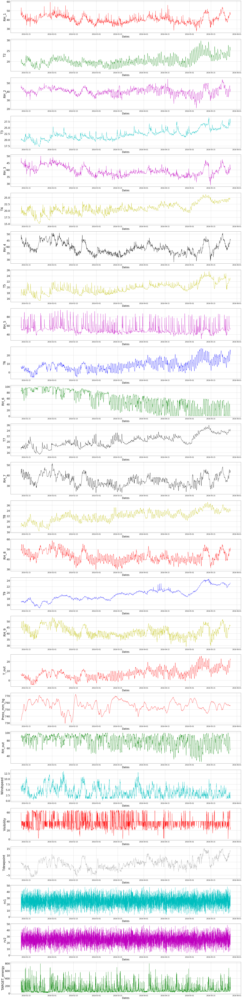

In [13]:
# Adjusting the graph size
fig = plt.subplots(figsize=(40,80))
plt.subplots_adjust(bottom = 0.8, top = 2.6)

# Each column is explored separately within the dataset.
for i in range(1, col_len-1):
    ax = plt.subplot(col_len,1,i)
    ax.plot(df2.iloc[:,i],ret_colour())
    
    # X_Axis and Y_Axis labels
    ax.set_xlabel('Dates', fontsize=25)
    ax.set_ylabel(column_list[i+1], fontsize=30)
    
    # Tick parameters
    ax.tick_params(labelsize=25,which='major',axis='y')
    ax.tick_params(labelsize=15,which='major',axis='x')
    
    # Plotting the grid
    ax.grid(axis='both')

In [14]:
# New graphs are boxplot and histogram with grid enables on the previous graphs

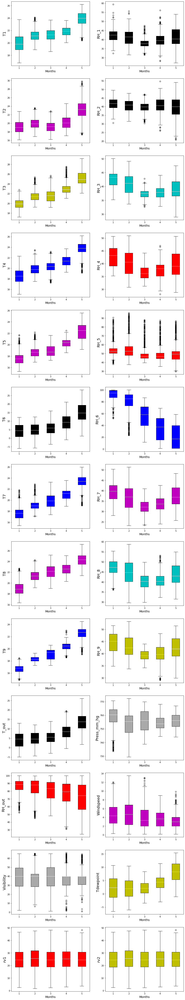

In [15]:
# Adjusting the graph layout
fig, ax = plt.subplots(figsize=(15,40))
plt.subplots_adjust(bottom=0.8,top=2.6)

# Grouping the dataframe
grouped = df2.groupby(df2.index.month)

# Plotting the graphs
for i in range(1,col_len-1):
    ax = plt.subplot(col_len//2,2,i)
    ax.boxplot([grouped.get_group(key)[column_list[i]] for key in grouped.groups.keys()],
              patch_artist=True,
              boxprops = dict(facecolor = ret_colour()),
              medianprops = dict(color = 'white')
              )
    
    # Setting the labels
    ax.set_xlabel('Months',fontsize=14)
    ax.set_ylabel(column_list[i], fontsize=18)

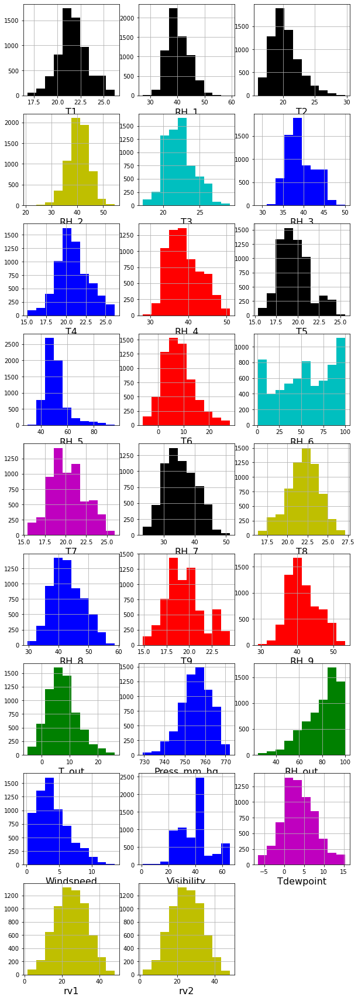

In [16]:
# Creating a histogram plot to as the last column exploration process

fig, ax = plt.subplots(figsize=(10,20))
plt.subplots_adjust(bottom=0.8, top=2.6)

for i in range(1,col_len-1):
    ax = plt.subplot(14,3,i)
    ax.hist(df2[column_list[i]],color=ret_colour())
    
    # Adding the labels
    ax.set_xlabel(column_list[i],fontsize=16)
    
    # Plotting the grid
    ax.grid()    

#### Visualizing independent variables with the tagret vector individually.

While plotting the graphs under these sections, we will use the same dataset which is downsampled and sorted.

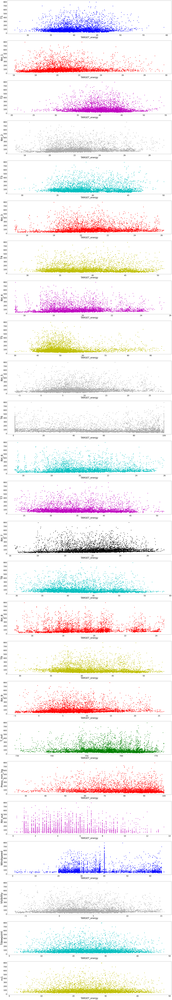

In [17]:
# Altering the figure size
fig, ax = plt.subplots(figsize=(40,140))
plt.subplots_adjust(bottom=0.5, top=2.0)

target = df2.iloc[:,-1]

for i in range(1, col_len-2):
    ax = plt.subplot(28,1,i)
    ax.scatter(df2.iloc[:,i],target,color=ret_colour())
    
    # Adding the labels for the axes
    ax.set_xlabel('TARGET_energy',fontsize=30)
    ax.set_ylabel(column_list[i],fontsize=36)
    
    # Configuring the ticks of the axes
    ax.tick_params(labelsize=25)
    

In [18]:
# Acquiring the target column
target = df2.iloc[:,-1]

# Setting the params for the histogram
n_bins=10
    

array([[<AxesSubplot:title={'center':'TARGET_energy'}>]], dtype=object)

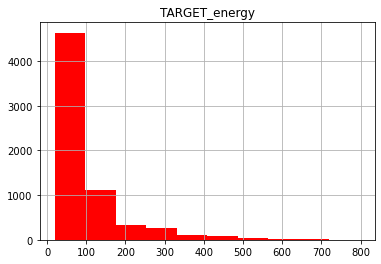

In [19]:
df2.hist(column='TARGET_energy', bins=10, color=ret_colour())

In [20]:
df.head()


,date,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
0,2016-04-19 20:30:00,22.200000,39.500000,20.566667,37.656667,22.230000,37.030000,22.318571,36.610000,20.633333,62.166667,8.823333,13.296667,21.00,29.318571,22.23,38.463333,19.926667,33.90,9.70,766.100000,65.5,3.500000,40.000000,3.350000,24.061869,24.061869,60
1,2016-03-05 04:40:00,20.356667,37.126667,17.566667,40.230000,20.890000,37.663333,18.700000,36.260000,18.463333,43.560000,1.230000,78.963333,18.39,32.290000,21.00,43.400000,18.390000,41.09,0.30,740.333333,99.0,1.000000,41.333333,0.100000,4.622052,4.622052,50
2,2016-03-14 12:40:00,20.926667,38.790000,21.100000,35.526667,21.600000,36.290000,21.000000,34.826667,18.100000,46.126667,6.033333,37.300000,21.29,27.566667,21.70,32.447500,19.390000,38.76,4.40,768.466667,72.0,6.000000,22.666667,-0.266667,5.635898,5.635898,80
3,2016-01-22 15:30:00,18.290000,38.900000,17.290000,39.260000,18.390000,39.326667,16.100000,38.790000,16.100000,47.700000,4.595000,94.945000,16.20,33.590000,17.78,41.663333,15.800000,39.20,3.35,760.600000,82.0,5.500000,41.000000,0.500000,49.216445,49.216445,40
4,2016-02-10 00:40:00,22.290000,42.333333,21.600000,40.433333,22.666667,43.363333,19.100000,40.900000,19.290000,50.745000,2.530000,92.190000,20.00,40.000000,23.10,46.090000,18.890000,43.73,3.20,738.900000,88.0,7.333333,56.000000,1.400000,47.617579,47.617579,60


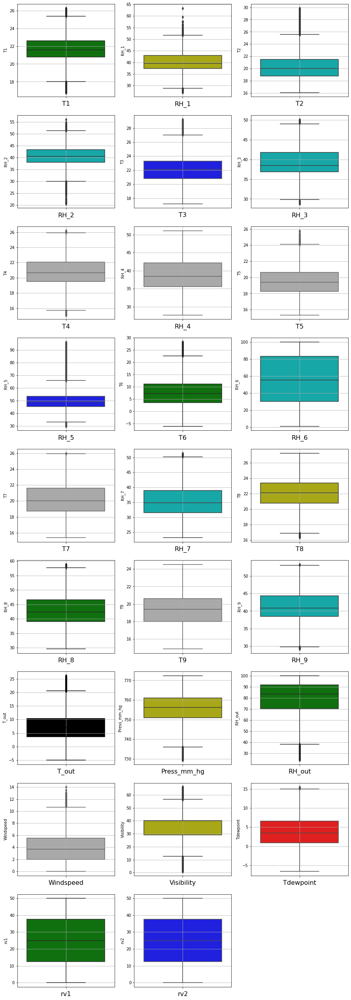

In [21]:
fig, ax = plt.subplots(figsize=(15,30))
plt.subplots_adjust(bottom=0.8, top=2.6)

for i in range(1,col_len-1):
    ax = plt.subplot(14,3,i)
    
    sns.boxplot(y = df[column_list[i]],color=ret_colour())
    
    # Adding the labels
    ax.set_xlabel(column_list[i],fontsize=16)
    
    # Plotting the grid
    ax.grid()

### Outlier Removal

Using the IQR technique to find the upper and lower bound of values outliers are being tracked and replaced with mean of that column.

In [22]:

for i in range(1, col_len-1):
    column = df.columns[i]
    Q1 = np.quantile(df[column], 0.25)
    Q3 = np.quantile(df[column], 0.75)
    

    IQR = Q3 - Q1
    mean = df[column].mean()

    upper_value = Q3 + 1.5*IQR
    lower_value = Q1 - 1.5*IQR

    for num in df[column]:
        if((num > upper_value) or (num<lower_value)):
            df[column].replace(num, mean, inplace=True)

In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 28 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           19735 non-null  object 
 1   T1             19735 non-null  float64
 2   RH_1           19735 non-null  float64
 3   T2             19735 non-null  float64
 4   RH_2           19735 non-null  float64
 5   T3             19735 non-null  float64
 6   RH_3           19735 non-null  float64
 7   T4             19735 non-null  float64
 8   RH_4           19735 non-null  float64
 9   T5             19735 non-null  float64
 10  RH_5           19735 non-null  float64
 11  T6             19735 non-null  float64
 12  RH_6           19735 non-null  float64
 13  T7             19735 non-null  float64
 14  RH_7           19735 non-null  float64
 15  T8             19735 non-null  float64
 16  RH_8           19735 non-null  float64
 17  T9             19735 non-null  float64
 18  RH_9  

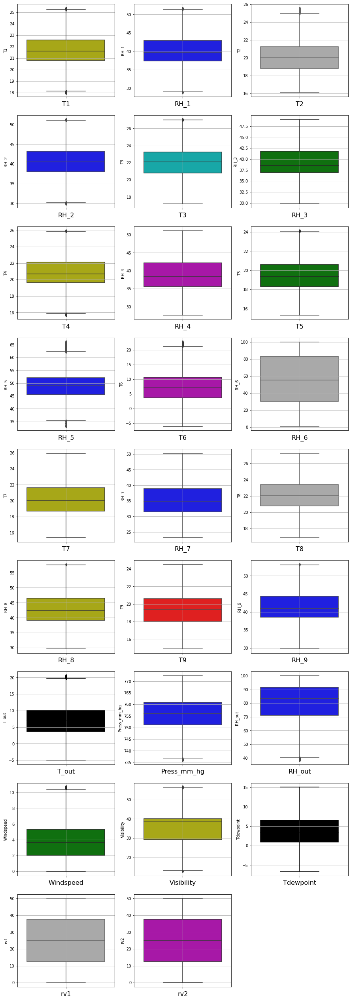

In [24]:
fig, ax = plt.subplots(figsize=(15,30))
plt.subplots_adjust(bottom=0.8, top=2.6)

for i in range(1,col_len-1):
    ax = plt.subplot(14,3,i)
    sns.boxplot(y = df[column_list[i]],color=ret_colour())
    
    # Adding the labels
    ax.set_xlabel(column_list[i],fontsize=16)
    
    # Plotting the grid
    ax.grid()

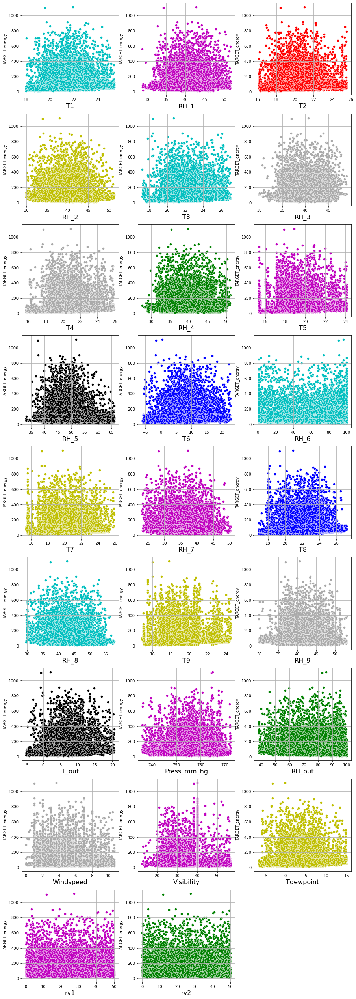

In [25]:
fig, ax = plt.subplots(figsize=(15,30))
plt.subplots_adjust(bottom=0.8, top=2.6)

for i in range(1,col_len-1):
    ax = plt.subplot(14,3,i)
    sns.scatterplot(x = df[column_list[i]],y=df['TARGET_energy'],color=ret_colour())
    
    # Adding the labels
    ax.set_xlabel(column_list[i],fontsize=16)
    
    # Plotting the grid
    ax.grid()

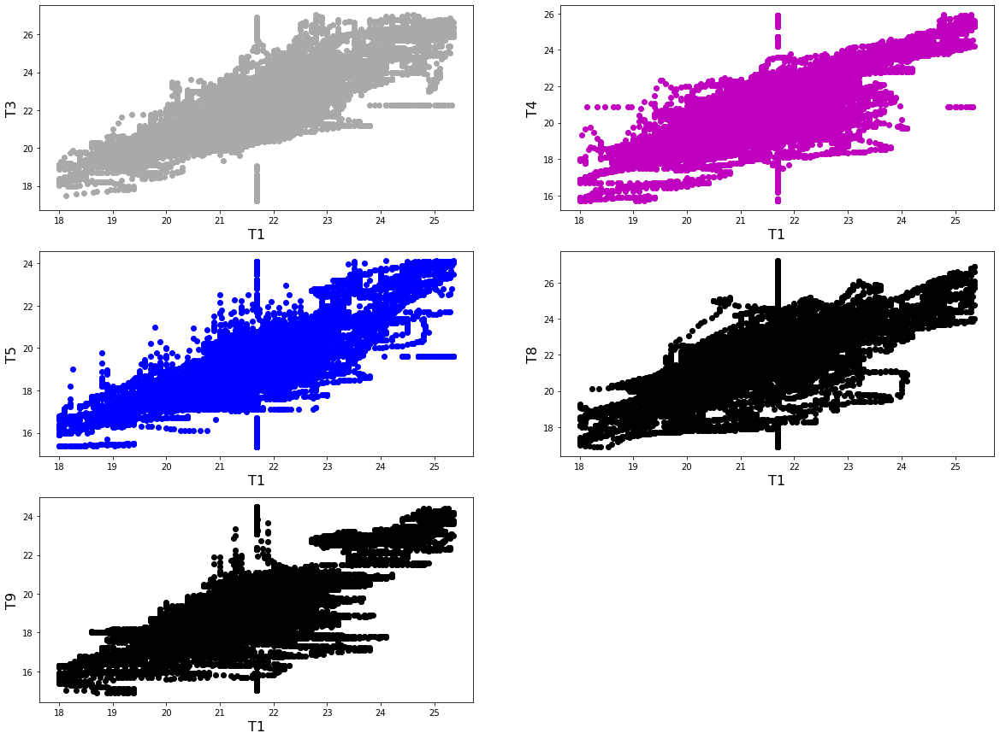

In [26]:
# These columns are received through feature engineering done in the feature engineering section below
fig = plt.subplots(figsize=(20,15))
mainCol = df['T1']
removed_cols_list = ['T3','T4','T5','T8','T9']

for i in range(1,len(removed_cols_list)+1):
    
    ax = plt.subplot(3,2,i)
    ax.scatter(mainCol,df[removed_cols_list[i-1]],color = ret_colour())
    
    # Setting the labels
    ax.set_xlabel('T1',fontsize=16)
    ax.set_ylabel(removed_cols_list[i-1],fontsize=16)

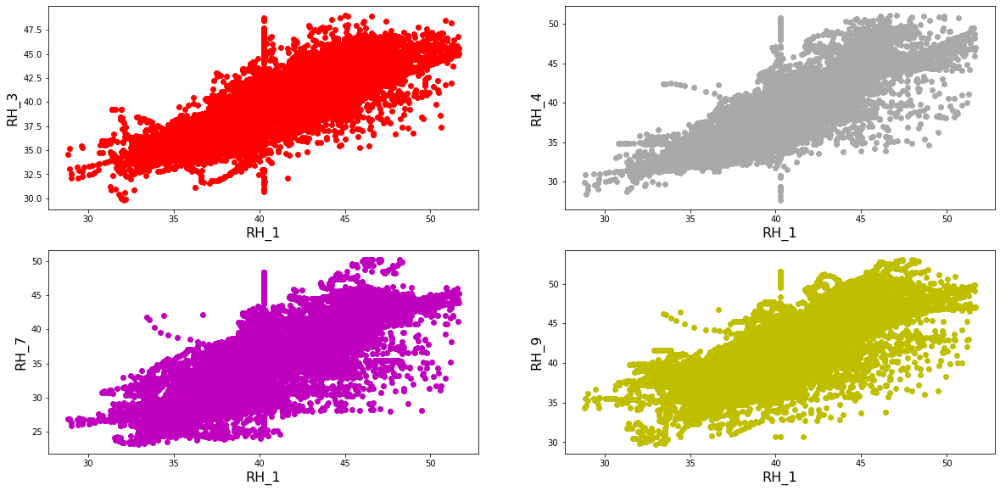

In [27]:
# These columns are received through feature engineering done in the feature engineering section below
fig = plt.subplots(figsize=(20,15))
mainCol = df['RH_1']
removed_cols_list = ['RH_3','RH_4','RH_7','RH_9']

for i in range(1,len(removed_cols_list)+1):
    
    ax = plt.subplot(3,2,i)
    ax.scatter(mainCol,df[removed_cols_list[i-1]],color = ret_colour())
    
    # Setting the labels
    ax.set_xlabel('RH_1',fontsize=16)
    ax.set_ylabel(removed_cols_list[i-1],fontsize=16)

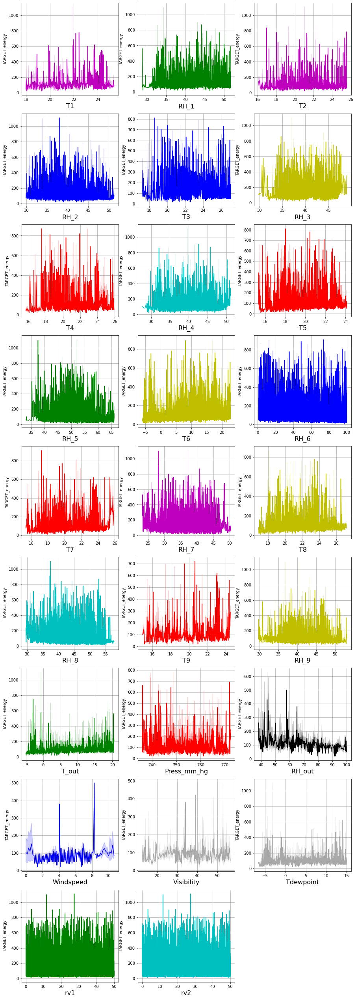

In [29]:
fig, ax = plt.subplots(figsize=(15,30))
plt.subplots_adjust(bottom=0.8, top=2.6)

for i in range(1,col_len-1):
    ax = plt.subplot(14,3,i)
    sns.lineplot(x = df[column_list[i]],y=df['TARGET_energy'],color=ret_colour())
    
    # Adding the labels
    ax.set_xlabel(column_list[i],fontsize=16)
    
    # Plotting the grid
    ax.grid()

<AxesSubplot:>

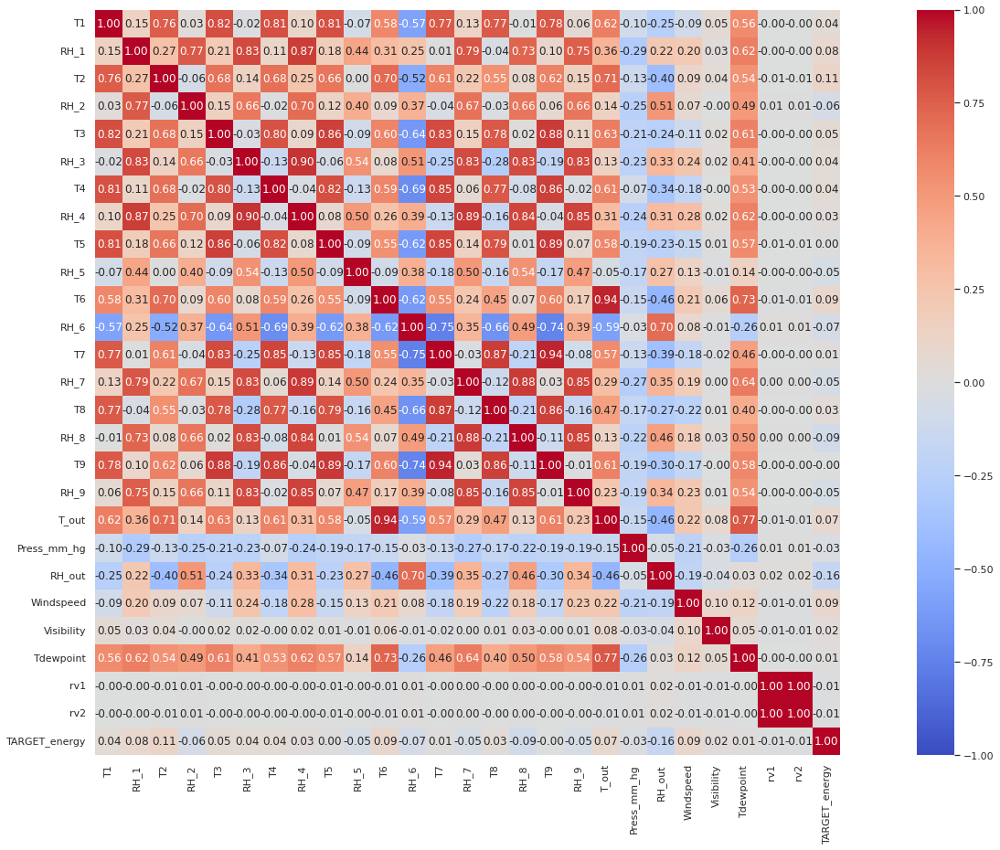

In [30]:
relation = df.corr()
sns.set(rc = {'figure.figsize':(30,15)})
sns.heatmap(relation, vmin=-1, vmax=1, center=0, square=True, annot=True, fmt='.2f', cmap='coolwarm')

In [31]:
df.head()

,date,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
0,2016-04-19 20:30:00,22.200000,39.500000,20.566667,37.656667,22.230000,37.030000,22.318571,36.610000,20.633333,62.166667,8.823333,13.296667,21.00,29.318571,22.23,38.463333,19.926667,33.90,9.70,766.100000,65.5,3.500000,40.000000,3.350000,24.061869,24.061869,60
1,2016-03-05 04:40:00,20.356667,37.126667,17.566667,40.230000,20.890000,37.663333,18.700000,36.260000,18.463333,43.560000,1.230000,78.963333,18.39,32.290000,21.00,43.400000,18.390000,41.09,0.30,740.333333,99.0,1.000000,41.333333,0.100000,4.622052,4.622052,50
2,2016-03-14 12:40:00,20.926667,38.790000,21.100000,35.526667,21.600000,36.290000,21.000000,34.826667,18.100000,46.126667,6.033333,37.300000,21.29,27.566667,21.70,32.447500,19.390000,38.76,4.40,768.466667,72.0,6.000000,22.666667,-0.266667,5.635898,5.635898,80
3,2016-01-22 15:30:00,18.290000,38.900000,17.290000,39.260000,18.390000,39.326667,16.100000,38.790000,16.100000,47.700000,4.595000,94.945000,16.20,33.590000,17.78,41.663333,15.800000,39.20,3.35,760.600000,82.0,5.500000,41.000000,0.500000,49.216445,49.216445,40
4,2016-02-10 00:40:00,22.290000,42.333333,21.600000,40.433333,22.666667,43.363333,19.100000,40.900000,19.290000,50.745000,2.530000,92.190000,20.00,40.000000,23.10,46.090000,18.890000,43.73,3.20,738.900000,88.0,7.333333,56.000000,1.400000,47.617579,47.617579,60


### Whole Dataset Unscaled Features

In [32]:
X = df.drop(['TARGET_energy', 'date'], axis=1)
y = df['TARGET_energy']

In [33]:
from sklearn.model_selection import train_test_split
X_data, X_test, y_data, y_test = train_test_split(X, y, test_size = 0.1, shuffle=True)


X_train, X_val, y_train, y_val = train_test_split(X_data, y_data, test_size = 0.2, shuffle=True)

In [34]:
Train_X = pd.DataFrame(X_train, columns = ['T1', 'RH_1','T2','RH_2','T3','RH_3','T4','RH_4','T5','RH_5','T6','RH_6','T7','RH_7','T8','RH_8','T9','RH_9','T_out','Press_mm_hg','RH_out','Windspeed','Visibility','Tdewpoint','rv1','rv2'])
Df_scaled = pd.concat([X_train, y_train], axis=1, join='inner')
Df_scaled.head()

,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
4641,23.100000,45.290000,21.500000,46.9000,24.890000,42.090000,23.260000,43.76,22.600000,49.200000,13.13,50.066667,22.890,40.960000,23.50,52.160000,22.600000,45.776,14.133333,757.616667,90.833333,3.166667,30.000000,12.683333,41.788345,41.788345,50
8824,21.890000,40.126667,20.426667,40.2300,24.133333,37.000000,20.200000,37.73,19.790000,50.700000,11.10,3.490000,19.700,31.000000,22.70,37.363333,19.463333,37.700,9.633333,760.866667,67.000000,6.000000,40.000000,3.700000,26.860063,26.860063,70
14340,21.390000,39.000000,19.390000,39.8450,21.000000,39.466667,21.966667,38.59,19.200000,42.900000,-1.53,79.823333,19.200,31.633333,21.79,40.245000,18.000000,39.090,-0.600000,768.600000,92.000000,2.000000,29.000000,-1.800000,42.621715,42.621715,90
14009,18.166667,39.466667,17.200000,38.6175,18.500000,39.826667,17.033333,37.36,16.027778,53.568333,-2.59,93.026667,15.945,32.834444,18.72,44.770556,15.800000,42.390,-2.466667,763.100000,90.666667,1.333333,56.333333,-3.800000,1.229018,1.229018,60
7279,22.033333,41.293333,21.100000,40.2300,23.028571,42.285714,18.200000,44.59,17.600000,53.168571,10.69,83.060000,17.760,39.730000,21.00,48.626667,17.700000,44.290,10.033333,754.800000,86.000000,6.666667,32.666667,7.800000,35.922756,35.922756,80


## Data Modelling

In [35]:
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn import neighbors
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from math import sqrt
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

In [36]:
# Creating the list of models to be used for modelling.
model_list = [
           ['Lasso: ', Lasso()],
           ['Ridge: ', Ridge()],
           ['LinearRegression:', LinearRegression()],
           ['DecisionTreeRegressor:', DecisionTreeRegressor()], 
           ['KNeighborsRegressor: ',  neighbors.KNeighborsRegressor()],
           ['SVR:' , SVR(kernel='rbf')],
           ['RandomForest ',RandomForestRegressor()]]

In [37]:
# Fitting the training data on the models.
model_data = []
for name, model in model_list:
    data = {}
    model.radom_state = 60
    data['Name'] = name
    model.fit(X_train, y_train)
    data["Train_R2_Score"] = r2_score(y_train,model.predict(X_train))
    data["Validation_R2_Score"] = r2_score(y_val,model.predict(X_val))
    data["Test_R2_Score"] = r2_score(y_test,model.predict(X_test))
    data["Test_RMSE_Score"] = (sqrt(mean_squared_error(y_test,model.predict(X_test))))/100
    
    model_data.append(data)
    

In [38]:
# Outputting the prediction results.
model_data

[{'Name': 'Lasso: ',
  'Train_R2_Score': 0.11440266377325681,
  'Validation_R2_Score': 0.1176178065854655,
  'Test_R2_Score': 0.09527937398310449,
  'Test_RMSE_Score': 1.00377388478342},
 {'Name': 'Ridge: ',
  'Train_R2_Score': 0.11708883118488134,
  'Validation_R2_Score': 0.12303375530379357,
  'Test_R2_Score': 0.09720336032581756,
  'Test_RMSE_Score': 1.0027059998282686},
 {'Name': 'LinearRegression:',
  'Train_R2_Score': 0.1170888328543247,
  'Validation_R2_Score': 0.12303674746060245,
  'Test_R2_Score': 0.0972004056484933,
  'Test_RMSE_Score': 1.0027076406575133},
 {'Name': 'DecisionTreeRegressor:',
  'Train_R2_Score': 1.0,
  'Validation_R2_Score': 0.1908360361787811,
  'Test_R2_Score': 0.1726439580795629,
  'Test_RMSE_Score': 0.9598975164817978},
 {'Name': 'KNeighborsRegressor: ',
  'Train_R2_Score': 0.4744242320834774,
  'Validation_R2_Score': 0.1782786588160491,
  'Test_R2_Score': 0.19534531419496448,
  'Test_RMSE_Score': 0.9466368775369293},
 {'Name': 'SVR:',
  'Train_R2_Score'

In [39]:
df_models = pd.DataFrame(model_data)
df_models

,Name,Train_R2_Score,Validation_R2_Score,Test_R2_Score,Test_RMSE_Score
0,Lasso:,0.114403,0.117618,0.095279,1.003774
1,Ridge:,0.117089,0.123034,0.097203,1.002706
2,LinearRegression:,0.117089,0.123037,0.097200,1.002708
3,DecisionTreeRegressor:,1.000000,0.190836,0.172644,0.959898
4,KNeighborsRegressor:,0.474424,0.178279,0.195345,0.946637
5,SVR:,-0.118336,-0.098849,-0.112658,1.113165
6,RandomForest,0.937026,0.570323,0.586644,0.678486


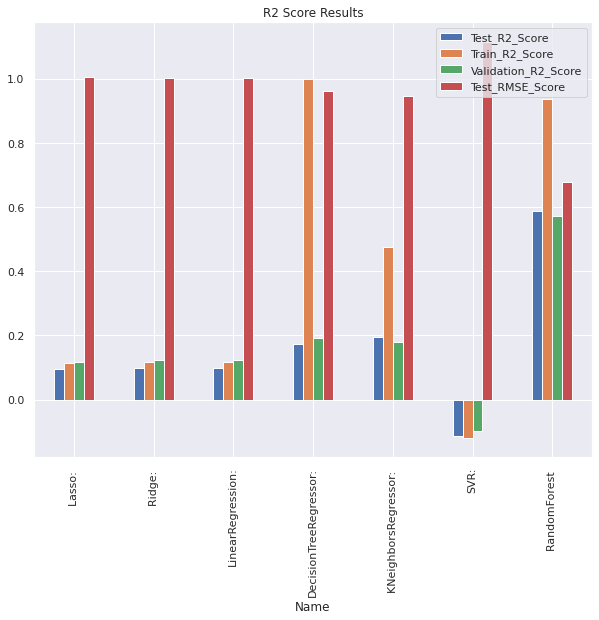

In [40]:
df_models.plot(x="Name", y=['Test_R2_Score' , 'Train_R2_Score' , 'Validation_R2_Score', 'Test_RMSE_Score'], kind="bar" , title = 'R2 Score Results' , figsize= (10,8)) ;

### Whole Dataset Scaled Features

Using the scaled data with all the features from the dataset as training data.

In [41]:
X = df.drop(['TARGET_energy', 'date'], axis=1)
y = df['TARGET_energy']

In [42]:
from sklearn.model_selection import train_test_split
X_data, X_test, y_data, y_test = train_test_split(X, y, test_size = 0.1, shuffle=True)


X_train, X_val, y_train, y_val = train_test_split(X_data, y_data, test_size = 0.2, shuffle=True)


from sklearn.preprocessing import StandardScaler

X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()
X_val_scaled = X_val.copy()


standardscaler = StandardScaler().fit(X_train_scaled)
train_X = standardscaler.transform(X_train_scaled)
val_X = standardscaler.transform(X_val_scaled)
test_X = standardscaler.transform(X_test_scaled)

X_train.shape

(14208, 26)

In [43]:
Train_X = pd.DataFrame(train_X, columns = ['T1', 'RH_1','T2','RH_2','T3','RH_3','T4','RH_4','T5','RH_5','T6','RH_6','T7','RH_7','T8','RH_8','T9','RH_9','T_out','Press_mm_hg','RH_out','Windspeed','Visibility','Tdewpoint','rv1','rv2'])
Df_scaled = pd.concat([Train_X, y_train], axis=1, join='inner')
Df_scaled.head()

,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2,TARGET_energy
1,0.299048,0.771304,0.369881,0.686916,0.314158,0.816433,0.413872,0.803589,0.360364,0.513132,0.377760,0.947691,0.238095,0.831947,0.214355,0.885648,0.223032,0.820403,0.390707,0.105046,0.870270,0.515625,0.623574,0.474903,0.875428,0.875428,50
2,0.761214,0.577385,0.579732,0.638385,0.742185,0.519501,0.752198,0.529839,0.655930,0.537787,0.508721,0.462353,0.743810,0.691440,0.757517,0.554305,0.780437,0.533219,0.568063,0.358716,0.886486,0.218750,0.623574,0.691120,0.632367,0.632367,80
7,0.421386,0.595902,0.306473,0.423676,0.447345,0.320506,0.235428,0.312206,0.234180,0.425889,0.223040,0.775430,0.296190,0.355796,0.381507,0.304582,0.292404,0.276039,0.272251,0.432110,0.881081,0.093750,0.456274,0.343629,0.782120,0.782120,400
8,0.596738,0.762410,0.634082,0.671495,0.495274,0.845777,0.550309,0.747614,0.675950,0.541955,0.397462,0.962892,0.305714,0.624967,0.405647,0.688442,0.334027,0.685812,0.447644,0.610092,0.708108,0.562500,0.326996,0.465637,0.949400,0.949400,80
9,0.647032,0.583217,0.654161,0.453583,0.915023,0.516554,0.580593,0.591369,0.624479,0.375386,0.796952,0.096630,0.609524,0.473285,0.738118,0.464639,0.613944,0.607515,0.789267,0.370642,0.367568,0.656250,0.623574,0.655598,0.230184,0.230184,100


<AxesSubplot:>

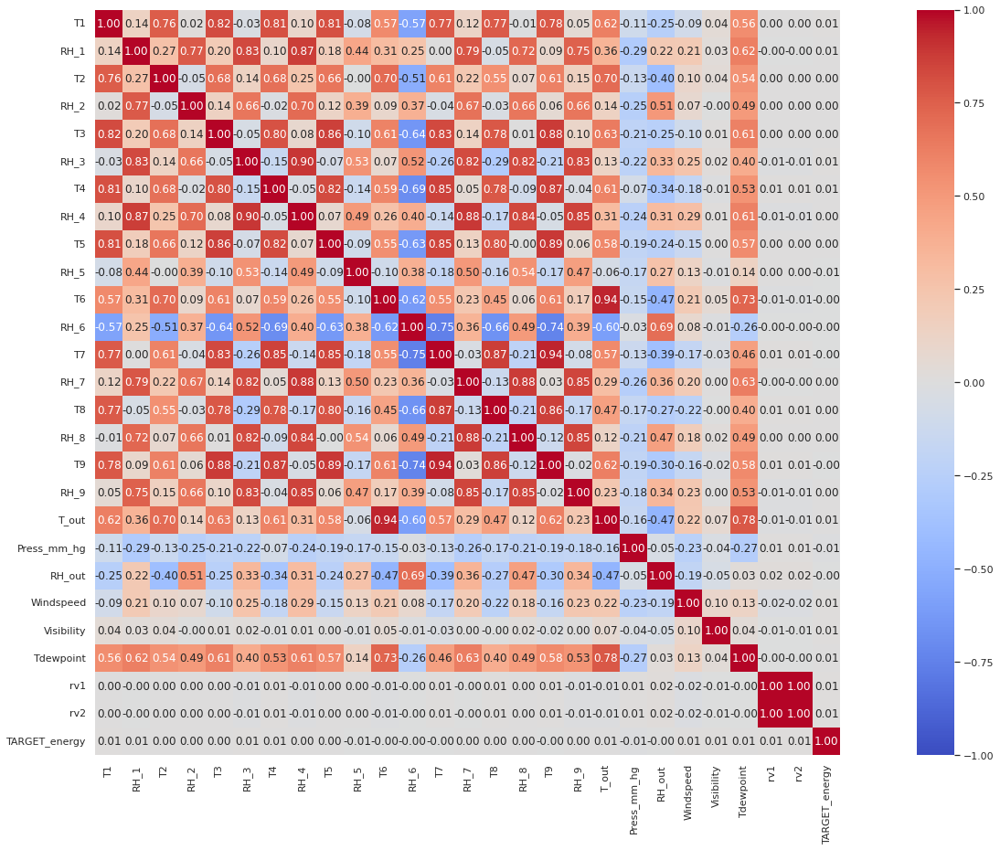

In [44]:
relation = Df_scaled.corr()
sns.set(rc = {'figure.figsize':(30,15)})
sns.heatmap(relation, vmin=-1, vmax=1, center=0, square=True, annot=True, fmt='.2f', cmap='coolwarm')

In [45]:
model_list = [
           ['Lasso: ', Lasso()],
           ['Ridge: ', Ridge()],
           ['LinearRegression:', LinearRegression()],
           ['DecisionTreeRegressor:', DecisionTreeRegressor()], 
           ['KNeighborsRegressor: ',  neighbors.KNeighborsRegressor()],
           ['SVR:' , SVR(kernel='rbf')],
           ['RandomForest ',RandomForestRegressor()]]

In [46]:
model_data = []
for name, model in model_list:
    data = {}
    model.radom_state = 60
    data['Name'] = name
    model.fit(train_X, y_train)
    data["Train_R2_Score"] = r2_score(y_train,model.predict(train_X))
    data["Validation_R2_Score"] = r2_score(y_val,model.predict(val_X))
    data["Test_R2_Score"] = r2_score(y_test,model.predict(test_X))
    data["Test_RMSE_Score"] = (sqrt(mean_squared_error(y_test,model.predict(test_X))))/100
    
    model_data.append(data)

In [47]:
model_data

[{'Name': 'Lasso: ',
  'Train_R2_Score': 0.04399629280790529,
  'Validation_R2_Score': 0.039072148580583166,
  'Test_R2_Score': 0.04222042604351273,
  'Test_RMSE_Score': 0.9113537609679548},
 {'Name': 'Ridge: ',
  'Train_R2_Score': 0.12265582834839195,
  'Validation_R2_Score': 0.10427029657175857,
  'Test_R2_Score': 0.09154489304206836,
  'Test_RMSE_Score': 0.8875767963518798},
 {'Name': 'LinearRegression:',
  'Train_R2_Score': 0.12268743665584803,
  'Validation_R2_Score': 0.10427153059558114,
  'Test_R2_Score': 0.09055791725407836,
  'Test_RMSE_Score': 0.8880588119170956},
 {'Name': 'DecisionTreeRegressor:',
  'Train_R2_Score': 1.0,
  'Validation_R2_Score': 0.1530312717503698,
  'Test_R2_Score': -0.06290418059511249,
  'Test_RMSE_Score': 0.960066381527977},
 {'Name': 'KNeighborsRegressor: ',
  'Train_R2_Score': 0.5566108807969679,
  'Validation_R2_Score': 0.28948289150454654,
  'Test_R2_Score': 0.260754637637991,
  'Test_RMSE_Score': 0.8006606947550462},
 {'Name': 'SVR:',
  'Train_R2_

In [48]:
df_models = pd.DataFrame(model_data)

In [49]:
df_models

,Name,Train_R2_Score,Validation_R2_Score,Test_R2_Score,Test_RMSE_Score
0,Lasso:,0.043996,0.039072,0.042220,0.911354
1,Ridge:,0.122656,0.104270,0.091545,0.887577
2,LinearRegression:,0.122687,0.104272,0.090558,0.888059
3,DecisionTreeRegressor:,1.000000,0.153031,-0.062904,0.960066
4,KNeighborsRegressor:,0.556611,0.289483,0.260755,0.800661
5,SVR:,-0.005948,-0.015757,0.004199,0.929267
6,RandomForest,0.938342,0.529274,0.524452,0.642172


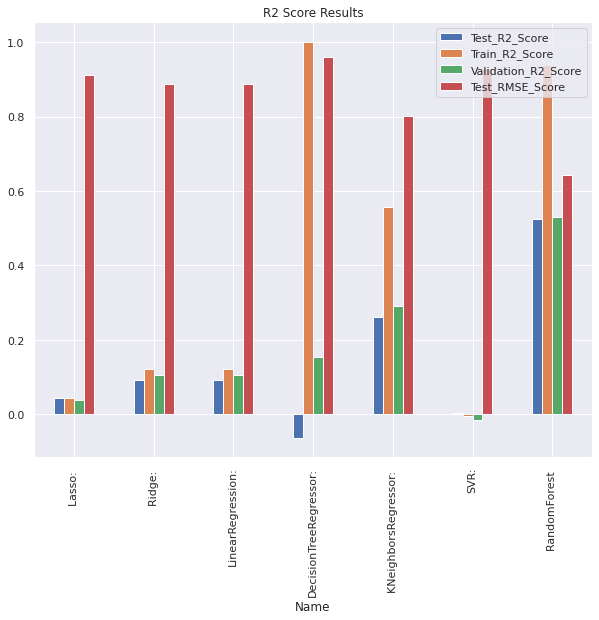

In [50]:
df_models.plot(x="Name", y=['Test_R2_Score' , 'Train_R2_Score' , 'Validation_R2_Score', 'Test_RMSE_Score'], kind="bar" , title = 'R2 Score Results' , figsize= (10,8)) ;

### Feature Engineered Dataset Without Scaling

From both the heatmaps, we have seen that their are some independent columns that have some relation with the other columns. Using the heatmap we have concluded that some columns may be redundant and can be removed.

The column 'T1' has Pearson Correlation Value of 0.76 with 'T2', 0.82 with 'T3', 0.81 with 'T4', 0.81 with 'T5', 0.77 in 'T7', 0.77 with 'T8', 0.78 with 'T9' and 0.62 with 'T_out'. It shares a relation with most of the columns and does not hold individual significance. it has a very less value of 0.00 with the target variable and hence will be removed.

The column 'T2', however is related the max with columns 'T3', 'T4', 'T6' and 'T_out' with values 0.68, 0.68, 0.70 and 0.71. It is not related with most of the other columns, and even those it is related to, it does not show a very large relation like the column 'T1'.

The columns 'T3' and 'T4' have established a similar relationship with each and every other column like 'T1' .They have most of their values above 0.80 with columns 'T1','T2','T5','T7','T8','T9' where 'T3' is related to 'T9' with a value of '0.88' make it the most similar to 'T9'. 'T4' has the highest relation with 'T5' with 0.82 value of the Pearson Correlation and hence both of them can be dropped.

By carrying a similar process all columns representing temperatures except 'T2', 'T6', 'T7' are considered redundant and removed.

A similar relation is seen between the columns representing the different rooms.Interestingly, 'RH_5' does not any relation with any other columns with all its values being lowered as compared to the other columns. 'RH_1' is related to most of the other rooms in terms of the values of Pearson Correlation Constant. It has a value of 0.77 with 'RH_2', 0.83 with 'RH_3', 0.87 with 'RH_4', 0.79 with 'RH_7', 0.73 with 'RH_8', 0.75 in 'RH_9'. 'RH_3', 'RH_4','RH_7' and 'RH_9' show a similar relation with other 'RH' columns in terms of this values. Similarly, 'RH_3' and 'RH_4' show their relation between themselves and the other columns with the highest value being 0.9 betweeen columns 'RH_3' and 'RH_4'. Other columns such as 'RH_9' show large values like 0.85, 0.88 with 'RH_5' and 'RH_8'.

### Backward Elimination for feature engineering

In [51]:
test_df = deepcopy(df)
test_col = test_df.iloc[:,-1] 
test_df = test_df.iloc[:,1:-1]
column_list = list(test_df.columns)
remove_cols = []

X_train_opt = np.append(arr = np.ones((19735,1)).astype(int), values = test_df, axis = 1)
result = sm.OLS(exog=X_train_opt,endog = np.asarray(test_col)).fit()

print(len(result.pvalues))

while np.any(np.array(result.pvalues.tolist()) > 0.05):
    X_train_opt = np.append(arr = np.ones((19735,1)).astype(int), values = test_df, axis = 1)
    result = sm.OLS(exog=X_train_opt,endog = test_col).fit()
    p_values = list(result.pvalues.values)[1:]
    p_max = max(p_values)
    if p_max>0.05:
        p_index = p_values.index(p_max)
        remove_cols.append(test_df.columns[p_index])
        test_df = test_df.drop(test_df.columns[p_index], axis=1)
    else:
        break

27


In [52]:
unwanted_cols = ['TARGET_energy', 'date', 'T1', 'T3', 'T4', 'T5', 'T8','T9','RH_1', 'RH_3', 'RH_4', 'RH_7', 'RH_9', 'Tdewpoint', 'rv1', 'rv2', 'Press_mm_hg', 'T7', 'RH_6', 'Visibility', 'T2']
X = df.drop(unwanted_cols, axis=1)
y = df['TARGET_energy']

In [53]:
from sklearn.model_selection import train_test_split
X_data, X_test, y_data, y_test = train_test_split(X, y, test_size = 0.1, shuffle=True)


X_train, X_val, y_train, y_val = train_test_split(X_data, y_data, test_size = 0.2, shuffle=True)



In [54]:
column_list = [x for x in df.columns if x not in unwanted_cols]
Train_X = pd.DataFrame(X_train, columns = column_list)
Df_scaled = pd.concat([X_train, y_train], axis=1, join='inner')
Df_scaled.head()

,T2,RH_2,RH_5,T6,RH_6,T7,RH_8,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,TARGET_energy
3225,18.633333,39.126667,52.152857,0.200000,84.000000,19.50,43.530000,0.050000,755.500000,92.500000,1.000000,43.000000,50
2163,22.600000,39.900000,41.633333,11.768571,24.824286,24.20,40.500000,11.150000,752.400000,82.000000,1.500000,34.500000,50
11488,18.666667,43.060000,47.500000,9.293333,44.266667,20.20,41.090000,6.500000,764.833333,94.000000,1.333333,20.666667,50
4847,18.290000,40.466667,47.790000,4.623333,43.396667,20.20,42.500000,4.650000,764.150000,92.500000,2.000000,26.000000,50
14202,18.633333,42.030000,46.933333,0.988889,66.738333,20.79,43.334444,3.866667,758.433333,86.333333,2.833333,26.500000,40


In [55]:
model_list = [
           ['Lasso: ', Lasso()],
           ['Ridge: ', Ridge()],
           ['LinearRegression:', LinearRegression()],
           ['DecisionTreeRegressor:', DecisionTreeRegressor()], 
           ['KNeighborsRegressor: ',  neighbors.KNeighborsRegressor()],
           ['SVR:' , SVR(kernel='rbf')],
           ['RandomForest ',RandomForestRegressor()]]

In [56]:
model_data = []
for name, model in model_list:
    data = {}
    model.radom_state = 60
    data['Name'] = name
    model.fit(train_X, y_train)
    data["Train_R2_Score"] = r2_score(y_train,model.predict(train_X))
    data["Validation_R2_Score"] = r2_score(y_val,model.predict(val_X))
    data["Test_R2_Score"] = r2_score(y_test,model.predict(test_X))
    data["Test_RMSE_Score"] = (sqrt(mean_squared_error(y_test,model.predict(test_X))))/100
    
    model_data.append(data)
    

In [57]:
model_data

[{'Name': 'Lasso: ',
  'Train_R2_Score': 0.0,
  'Validation_R2_Score': -0.00021690988094213992,
  'Test_R2_Score': -0.00042295844439332875,
  'Test_RMSE_Score': 0.9892894980076866},
 {'Name': 'Ridge: ',
  'Train_R2_Score': 0.0023587913902115565,
  'Validation_R2_Score': 0.0009141214528400887,
  'Test_R2_Score': -0.0046116690918374115,
  'Test_RMSE_Score': 0.9913583824558198},
 {'Name': 'LinearRegression:',
  'Train_R2_Score': 0.002360119058706367,
  'Validation_R2_Score': 0.0009219096387527159,
  'Test_R2_Score': -0.0047193439617032595,
  'Test_RMSE_Score': 0.9914115082197479},
 {'Name': 'DecisionTreeRegressor:',
  'Train_R2_Score': 1.0,
  'Validation_R2_Score': -1.0830437777991135,
  'Test_R2_Score': -1.4275233200860784,
  'Test_RMSE_Score': 1.5410377561094382},
 {'Name': 'KNeighborsRegressor: ',
  'Train_R2_Score': 0.19501421845172084,
  'Validation_R2_Score': -0.21503238102744748,
  'Test_R2_Score': -0.17189703877081097,
  'Test_RMSE_Score': 1.070720955117845},
 {'Name': 'SVR:',
  '

In [58]:
df_models = pd.DataFrame(model_data)
df_models

,Name,Train_R2_Score,Validation_R2_Score,Test_R2_Score,Test_RMSE_Score
0,Lasso:,0.000000,-0.000217,-0.000423,0.989289
1,Ridge:,0.002359,0.000914,-0.004612,0.991358
2,LinearRegression:,0.002360,0.000922,-0.004719,0.991412
3,DecisionTreeRegressor:,1.000000,-1.083044,-1.427523,1.541038
4,KNeighborsRegressor:,0.195014,-0.215032,-0.171897,1.070721
5,SVR:,-0.129114,-0.135136,-0.129814,1.051320
6,RandomForest,0.839900,-0.142728,-0.156912,1.063853


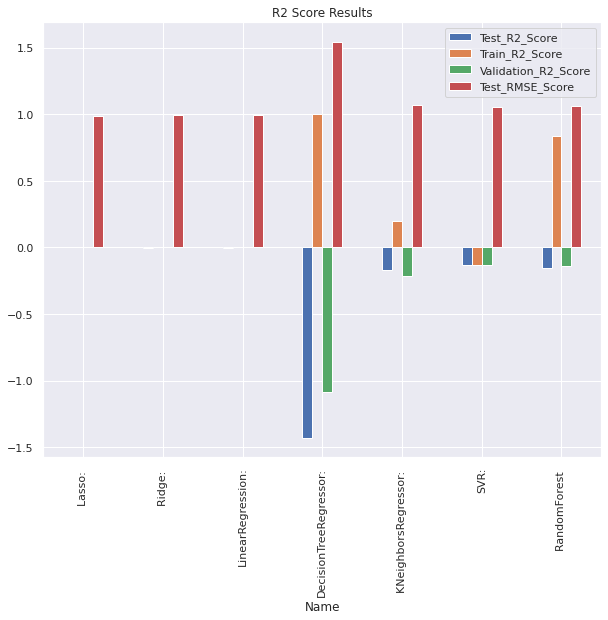

In [59]:
df_models.plot(x="Name", y=['Test_R2_Score' , 'Train_R2_Score' , 'Validation_R2_Score', 'Test_RMSE_Score'], kind="bar" , title = 'R2 Score Results' , figsize= (10,8)) ;

### Feature Engineered Dataset With Scaling

Using the columns filtered out using feature engineering and then scaling them before using them as the training data.

In [60]:
unwanted_cols = ['TARGET_energy', 'date', 'T1', 'T3', 'T4', 'T5', 'T8','T9','RH_1', 'RH_3', 'RH_4', 'RH_7', 'RH_9', 'Tdewpoint', 'rv1', 'rv2', 'Press_mm_hg', 'T7', 'RH_6', 'Visibility', 'T2']
X = df.drop(unwanted_cols, axis=1)
y = df['TARGET_energy']

In [61]:
from sklearn.model_selection import train_test_split
X_data, X_test, y_data, y_test = train_test_split(X, y, test_size = 0.1, shuffle=True)


X_train, X_val, y_train, y_val = train_test_split(X_data, y_data, test_size = 0.2, shuffle=True)


from sklearn.preprocessing import StandardScaler

X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()
X_val_scaled = X_val.copy()


standardscaler = StandardScaler().fit(X_train_scaled)
train_X = standardscaler.transform(X_train_scaled)
val_X = standardscaler.transform(X_val_scaled)
test_X = standardscaler.transform(X_test_scaled)

X_train.shape

(14208, 12)

In [62]:
column_list = [x for x in df.columns if x not in unwanted_cols]
Train_X = pd.DataFrame(train_X, columns = column_list)
Df_scaled = pd.concat([Train_X, y_train], axis=1, join='inner')
Df_scaled.head()

,T2,RH_2,RH_5,T6,RH_6,T7,RH_8,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,TARGET_energy
0,0.570825,0.494929,0.351096,0.289448,0.959218,0.332173,0.723220,0.340889,0.757909,0.870270,0.281250,0.172414,60
1,0.072939,0.349821,0.747143,0.243901,0.961527,0.105346,0.399312,0.173496,0.678588,0.729730,0.218750,0.582318,50
3,0.147992,0.281167,0.365265,0.012273,0.787240,0.298323,0.312022,0.023758,0.758826,0.843243,0.093750,0.582318,40
4,0.442918,0.349821,0.605233,0.360144,0.358578,0.427080,0.245421,0.333043,0.374140,0.697297,0.531250,0.406130,60
5,0.439746,0.511936,0.541955,0.216666,0.838895,0.345777,0.505068,0.240846,0.670335,0.910811,0.140625,0.264368,50


<AxesSubplot:>

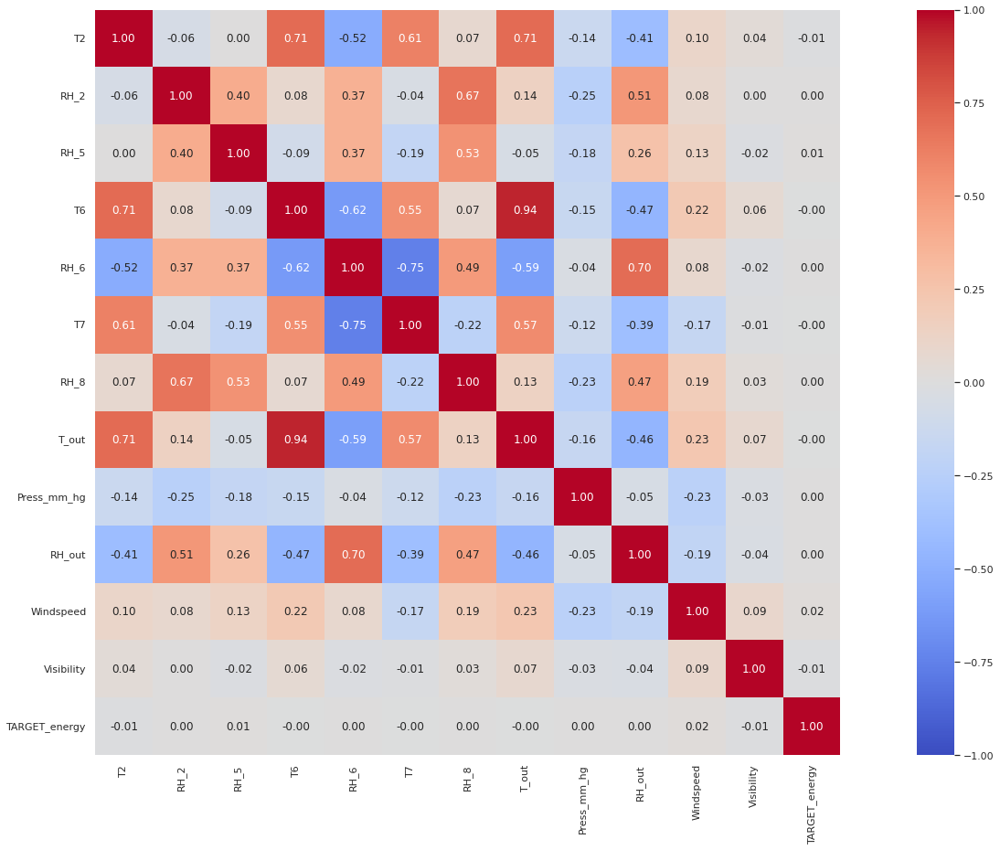

In [63]:
relation = Df_scaled.corr()
sns.set(rc = {'figure.figsize':(30,15)})
sns.heatmap(relation, vmin=-1, vmax=1, center=0, square=True, annot=True, fmt='.2f', cmap='coolwarm')

In [64]:
model_list = [
           ['Lasso: ', Lasso()],
           ['Ridge: ', Ridge()],
           ['LinearRegression:', LinearRegression()],
           ['DecisionTreeRegressor:', DecisionTreeRegressor()], 
           ['KNeighborsRegressor: ',  neighbors.KNeighborsRegressor()],
           ['SVR:' , SVR(kernel='rbf')],
           ['RandomForest ',RandomForestRegressor()]]

In [65]:
model_data = []
for name, model in model_list:
    data = {}
    model.radom_state = 60
    data['Name'] = name
    model.fit(train_X, y_train)
    data["Train_R2_Score"] = r2_score(y_train,model.predict(train_X))
    data["Validation_R2_Score"] = r2_score(y_val,model.predict(val_X))
    data["Test_R2_Score"] = r2_score(y_test,model.predict(test_X))
    data["Test_RMSE_Score"] = (sqrt(mean_squared_error(y_test,model.predict(test_X))))/100
    
    model_data.append(data)
    

In [66]:
model_data

[{'Name': 'Lasso: ',
  'Train_R2_Score': 0.028474707081394435,
  'Validation_R2_Score': 0.02627357164245714,
  'Test_R2_Score': 0.021756854144611926,
  'Test_RMSE_Score': 1.0724098111859355},
 {'Name': 'Ridge: ',
  'Train_R2_Score': 0.05348816799085043,
  'Validation_R2_Score': 0.04675769266173213,
  'Test_R2_Score': 0.045128605915117026,
  'Test_RMSE_Score': 1.0595215959294886},
 {'Name': 'LinearRegression:',
  'Train_R2_Score': 0.053490572043251805,
  'Validation_R2_Score': 0.046760833862206086,
  'Test_R2_Score': 0.045179299163846776,
  'Test_RMSE_Score': 1.0594934710401},
 {'Name': 'DecisionTreeRegressor:',
  'Train_R2_Score': 1.0,
  'Validation_R2_Score': 0.26185309513225163,
  'Test_R2_Score': 0.31367716521964495,
  'Test_RMSE_Score': 0.8982590388701103},
 {'Name': 'KNeighborsRegressor: ',
  'Train_R2_Score': 0.6699012439128598,
  'Validation_R2_Score': 0.44153884894126294,
  'Test_R2_Score': 0.46232287763476354,
  'Test_RMSE_Score': 0.7950567897235465},
 {'Name': 'SVR:',
  'Trai

In [67]:
df_models = pd.DataFrame(model_data)

In [68]:
df_models

,Name,Train_R2_Score,Validation_R2_Score,Test_R2_Score,Test_RMSE_Score
0,Lasso:,0.028475,0.026274,0.021757,1.072410
1,Ridge:,0.053488,0.046758,0.045129,1.059522
2,LinearRegression:,0.053491,0.046761,0.045179,1.059493
3,DecisionTreeRegressor:,1.000000,0.261853,0.313677,0.898259
4,KNeighborsRegressor:,0.669901,0.441539,0.462323,0.795057
5,SVR:,-0.016484,-0.032118,-0.025752,1.098142
6,RandomForest,0.940613,0.550964,0.581080,0.701783


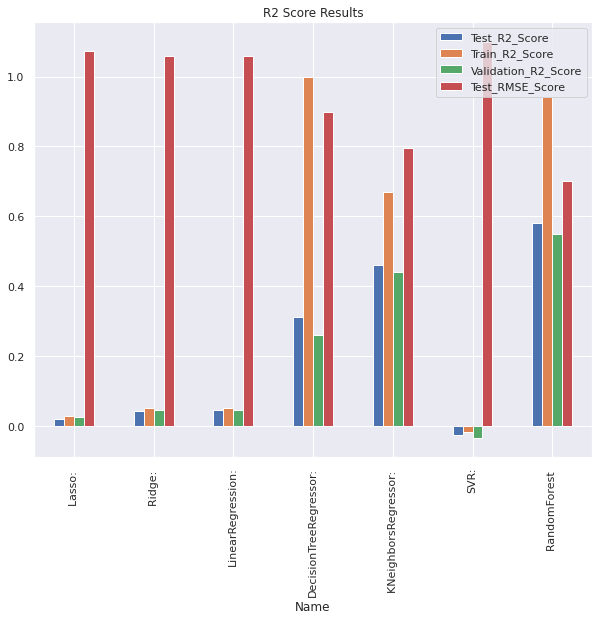

In [69]:
df_models.plot(x="Name", y=['Test_R2_Score' , 'Train_R2_Score' , 'Validation_R2_Score', 'Test_RMSE_Score'], kind="bar" , title = 'R2 Score Results' , figsize= (10,8)) ;

In [70]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(3).fit(train_X)
train_X_poly = poly.transform(train_X)
val_X_poly = poly.transform(val_X)
test_X_poly = poly.transform(test_X)

In [71]:
model_lr1 = LinearRegression().fit(train_X_poly, y_train)

In [72]:
test_pred = model_lr1.predict(test_X_poly)

In [73]:
print("Parameter of the Linear model: ", model_lr1.coef_)
print("Intercept of the Linear model: ", model_lr1.intercept_)

Parameter of the Linear model:  [-4.40226602e-10 -9.97535230e+02 -2.34363573e+03  1.04658922e+03
 -6.24585255e+03  2.05066653e+03  2.03775221e+03 -8.29195439e+02
  7.47429645e+03 -2.69728414e+03  2.66453976e+02  1.93123997e+03
  2.51424258e+02 -9.48727697e+02  1.42946078e+03  1.31431851e+03
  1.25299355e+03 -1.16855629e+03  3.81152422e+02  3.95741930e+03
 -2.79192949e+03 -1.36590424e+03  1.43546870e+03 -7.88286338e+02
  1.90169458e+03 -3.71922343e+03  1.63447042e+03 -4.22207641e+03
  5.65680845e+03  7.32569401e+03  2.50208251e+03  2.73299904e+03
 -9.63843080e+02  1.98583865e+03 -7.18876708e+02  1.30944915e+03
 -1.00389748e+03  1.18907609e+03  5.82212346e+01 -1.24912992e+03
  3.18832473e+02 -2.83911237e+03  4.32156665e+02 -9.48231251e+02
 -1.96851043e+02 -6.99501218e+02  7.08747893e+03  6.07066218e+03
 -3.33398563e+02  2.88468996e+03 -2.74390537e+03  4.92933768e+03
  5.39908065e+03  1.40909479e+03 -2.34544032e+03  4.11337230e+02
 -5.76038251e+03 -2.85613918e+03 -2.72205088e+03  1.311078

In [74]:
r2_lr1 = r2_score(y_test, test_pred)
print('The R^2 score for the linear regression model is: {:.3f}'.format(r2_lr1))

The R^2 score for the linear regression model is: 0.258


### Random Forest Regressor

In [75]:
from sklearn.ensemble import RandomForestRegressor
Rand = RandomForestRegressor()
Rand.fit(train_X, y_train)

RandomForestRegressor()

In [76]:
Rand_pred = Rand.predict(val_X)

In [77]:
Rand_pred_test = Rand.predict(test_X)

In [78]:
r2_rand = r2_score(y_val, Rand_pred)
print(r2_rand)

0.555620588662129


In [79]:
from sklearn.metrics import mean_squared_error
np.sqrt(mean_squared_error(y_test, Rand.predict(test_X)))

70.30493157848402

In [80]:
r2_rand = r2_score(y_test, Rand_pred_test)
print(r2_rand)

0.5795669616033143


### HyperParameter Tuning in Random Forest Regressor

In [81]:
grid_params = {
    'n_estimators':[90, 110, 120, 135],
    'max_depth':range(2, 20, 3),
    'max_features':['auto','log2', 'sqrt']
}

In [82]:
from sklearn.model_selection import GridSearchCV

grid = GridSearchCV(estimator=Rand, param_grid=grid_params, cv=3, n_jobs=-1, verbose=2)

In [83]:
grid.fit(train_X, y_train)

Fitting 3 folds for each of 72 candidates, totalling 216 fits


KeyboardInterrupt: 

In [ ]:
grid.best_params_

In [ ]:
rand_tuned = RandomForestRegressor(max_depth=17, max_features='sqrt', n_estimators=135, random_state=6)

In [ ]:
rand_tuned.fit(train_X, y_train)

In [ ]:
train_pred_rand = rand_tuned.predict(train_X)
val_pred_rand = rand_tuned.predict(val_X)
test_pred_rand = rand_tuned.predict(test_X)

In [ ]:
r2_train_rand = r2_score(y_train, train_pred_rand)
r2_val_rand = r2_score(y_val, val_pred_rand)
r2_test_rand = r2_score(y_test, test_pred_rand)

print('Train r2 score: {:3f}'.format(r2_train_rand))
print('Validation r2 score: {:3f}'.format(r2_val_rand))
print('Test r2 score: {:3f}'.format(r2_test_rand))

### K-Nearest Regressor

In [ ]:
knn = neighbors.KNeighborsRegressor()
knn.fit(train_X, y_train)

In [ ]:
train_pred = knn.predict(train_X)
val_pred = knn.predict(val_X)
test_pred = knn.predict(test_X)

In [ ]:
r2_train = r2_score(y_train, train_pred)
r2_val = r2_score(y_val, val_pred)
r2_test = r2_score(y_test, test_pred)

print('Train r2 score: {:3f}'.format(r2_train))
print('Validation r2 score: {:3f}'.format(r2_val))
print('Test r2 score: {:3f}'.format(r2_test))

In [ ]:
knn.get_params(deep=True)

### HyperParameter Tuning in K-NearestRegressor

In [ ]:
grid_param = {
    'n_neighbors':range(2,15,1),
    'weights':['uniform','distance'],
    'algorithm':['auto', 'kd_tree', 'ball_tree'],
    'leaf_size':range(15,35,5),
    'p':range(1,5,1)
}

In [ ]:
gridCV = GridSearchCV(estimator=knn, param_grid=grid_param, n_jobs=-1, cv=3, verbose=2)

In [ ]:
gridCV.fit(train_X, y_train)

In [ ]:
gridCV.best_params_


In [ ]:
knn_tuned = neighbors.KNeighborsRegressor(algorithm='auto', leaf_size=15, n_neighbors=4, p=1, weights='uniform'
                                          , metric='minkowski')
knn_tuned.fit(train_X, y_train)


In [ ]:
train_pred_tuned = knn_tuned.predict(train_X)
val_pred_tuned = knn_tuned.predict(val_X)
test_pred_tuned = knn_tuned.predict(test_X)

In [ ]:
r2_train_tuned = r2_score(y_train, train_pred_tuned)
r2_val_tuned = r2_score(y_val, val_pred_tuned)
r2_test_tuned = r2_score(y_test, test_pred_tuned)

print('Train r2 score: {:3f}'.format(r2_train_tuned))
print('Validation r2 score: {:3f}'.format(r2_val_tuned))
print('Test r2 score: {:3f}'.format(r2_test_tuned))

### Comparison

In [ ]:
data = {'Model':['Random Forest Regressor', 'K-Neighbor Regressor'],
       'Training r2 Score':[r2_train_rand, r2_train_tuned],
        'Validation r2 Score':[r2_val_rand, r2_val_tuned],
        'Testing r2 Score':[r2_test_rand, r2_test_tuned]
       }

results = pd.DataFrame(data)
results

In [ ]:
results.plot(x = "Model", y = ['Training r2 Score', 'Validation r2 Score', 'Testing r2 Score'], kind="bar" , title = 'R2 Score Results' , figsize= (10,8));
